**<center><h1>Evaluating Florence-2-large Vision Model on Documents</h1></center>**

## **Step 1. Install Libraries**

In [1]:
%%capture
! pip install timm flash_attn einops
! pip install supervision
! pip install aura-sr

## **Step 2. Import Libraries**

In [56]:
from transformers import AutoProcessor, AutoModelForCausalLM  
import requests
import copy
import supervision as sv
from typing import Dict
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Markdown, Latex
import random
import numpy as np

## **Step 3. Load Florence-2-large**

In [3]:
model_id = 'microsoft/Florence-2-large'
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True).eval().cuda()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

config.json:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

Florence2LanguageForConditionalGeneration has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

## **Step 4. OCR with Florence-2-large**

In [4]:
image = Image.open("/kaggle/input/the-rvlcdip-dataset-test/test/budget/0000009994.tif")

In [58]:
def run_example(task_prompt: str, text_input: str="", image=image) -> Dict:
    prompt = task_prompt + text_input

    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(generated_text, task=task_prompt, image_size=(image.width, image.height))
    return parsed_answer

In [59]:
def extract_text_florence_2_large(image_chosen):
    image = Image.open(image_chosen)#.convert("RGB")
    image_converted = image.convert('RGB')
    task_prompt = "<OCR_WITH_REGION>"
    answer = run_example(task_prompt=task_prompt, image=image_converted)
    bounding_box_annotator = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX)
    label_annotator = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX)

    detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, answer, resolution_wh=image.size)
    annotated = bounding_box_annotator.annotate(image_converted, detections=detections)
    annotated = label_annotator.annotate(annotated, detections=detections)
    sv.plot_images_grid(images=[annotated, image], grid_size=(1, 2), size=(50, 50))

In [64]:
def extract_text_from_images(image_to_process):
    prompt = '<OCR_WITH_REGION>'
    inputs = processor(text=prompt, images=image_to_process, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=4096,
        num_beams=3
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(generated_text, task=prompt, image_size=(image.width, image.height))
    return parsed_answer

In [65]:
def draw_ocr_bboxes(image_processed, prediction, scale_factor=2):
    # create a new white image of the same size as the original image
    new_image = Image.new('RGB', image_processed.size, color='white')
    draw_original = ImageDraw.Draw(image_processed)
    draw = ImageDraw.Draw(new_image)
    bboxes, labels = prediction['quad_boxes'], prediction['labels']
    for box, label in zip(bboxes, labels):
        #color = random.choice(colormap)
        new_box = (np.array(box)).tolist()
        #draw.polygon(new_box, width=3, outline='red')
        draw_original.polygon(new_box, width=3, outline='red')
        draw.text((new_box[0] + 8, new_box[1] + 2),
                  "{}".format(label),
                  align="right",
                  fill='red')
    
    # combine the original and new images side by side
    combined_image = Image.new('RGB', (image_processed.width * 2, image_processed.height))
    combined_image.paste(image, (0, 0))
    combined_image.paste(new_image, (image_processed.width, 0))
    # Resize the combined images
    resized_image = combined_image.resize((combined_image.width * scale_factor, combined_image.height * scale_factor))
    # display the combined images
    display(resized_image)

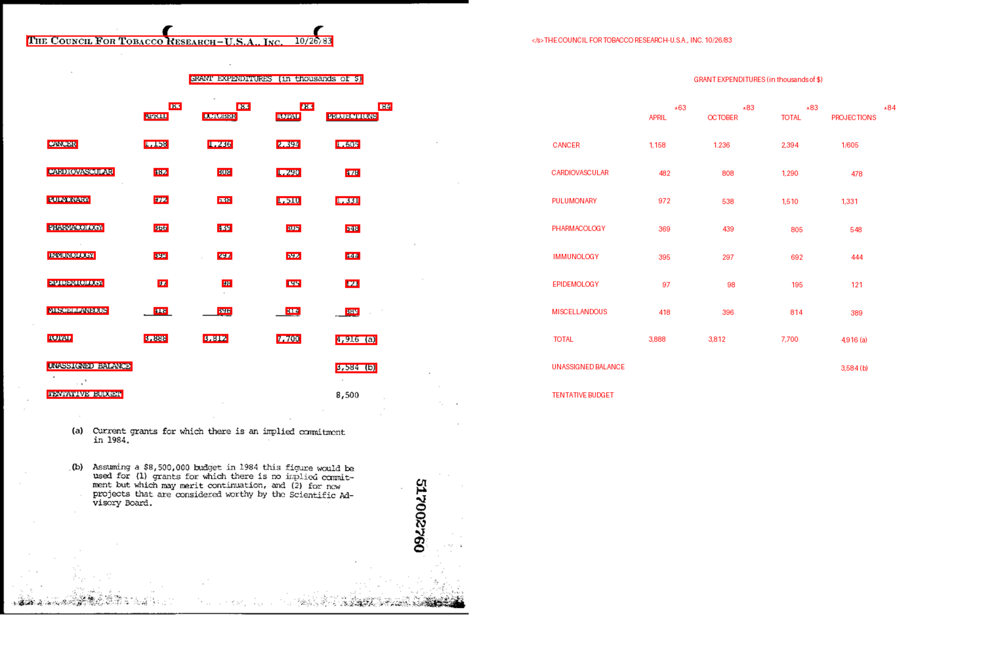

CPU times: user 9.92 s, sys: 3.64 ms, total: 9.92 s
Wall time: 9.92 s


In [67]:
%%time
path_image = "/kaggle/input/the-rvlcdip-dataset-test/test/budget/0000009994.tif"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

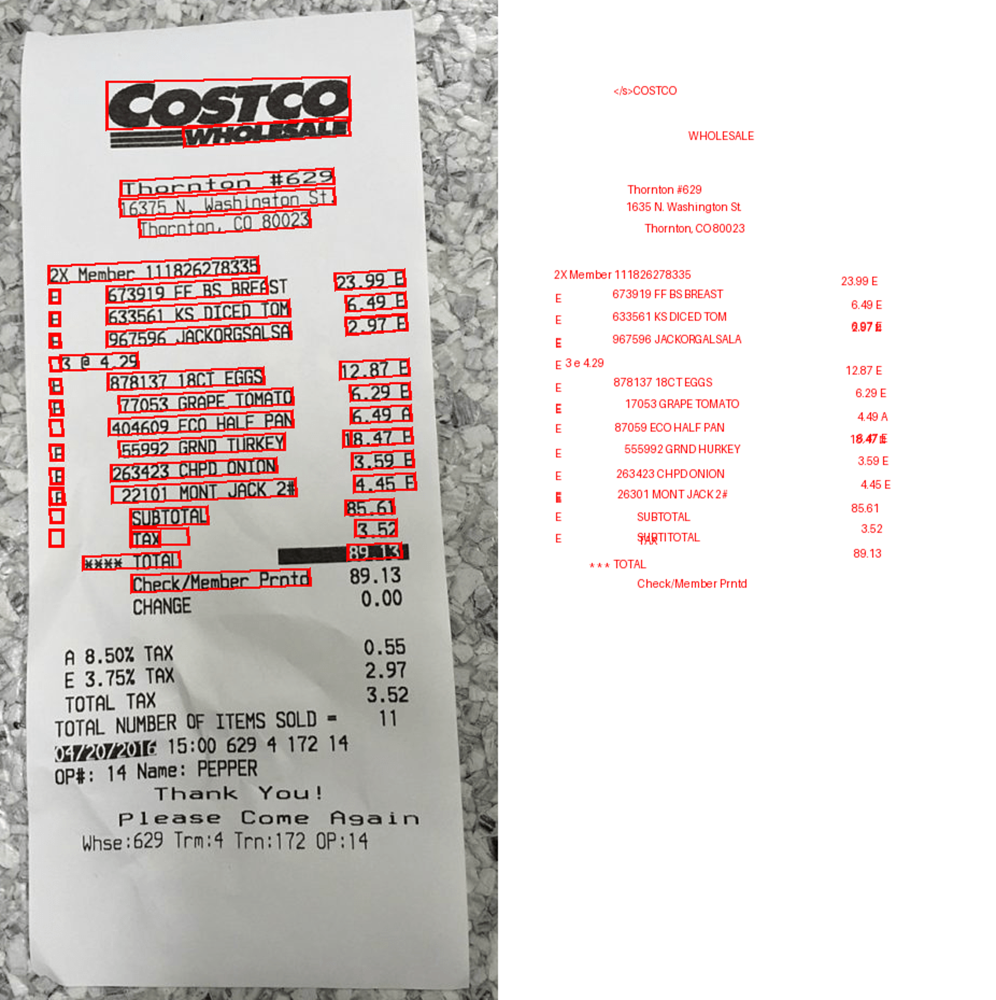

CPU times: user 9.86 s, sys: 5.31 ms, total: 9.87 s
Wall time: 9.88 s


In [68]:
%%time
path_image = "/kaggle/input/ocr-receipts-text-detection/images/8.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

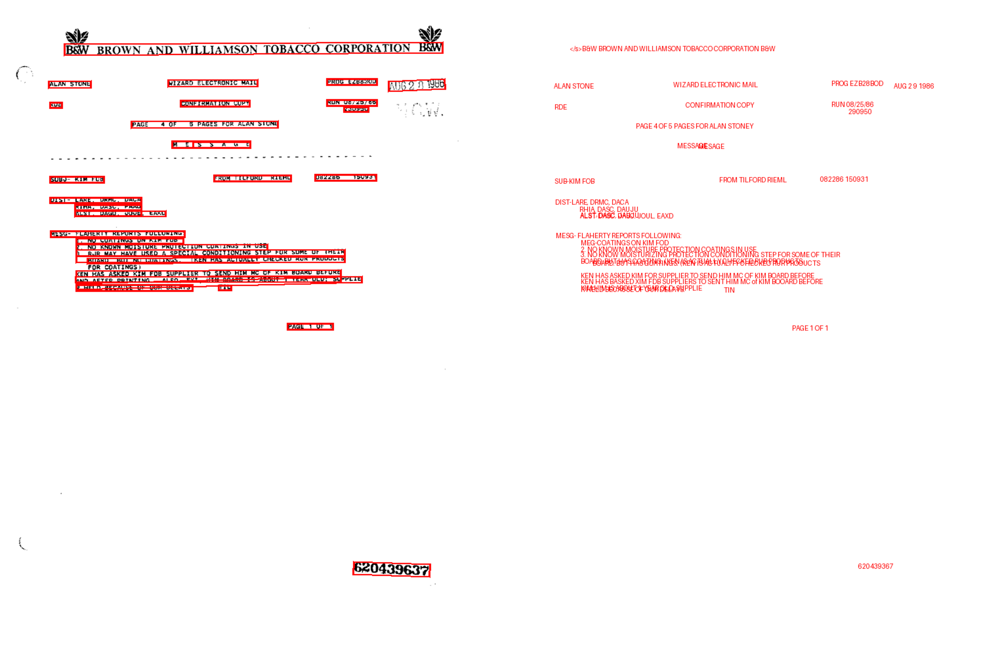

CPU times: user 10.2 s, sys: 6.81 ms, total: 10.2 s
Wall time: 10.2 s


In [70]:
%%time
path_image = "/kaggle/input/the-rvlcdip-dataset-test/test/email/0001451592.tif"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

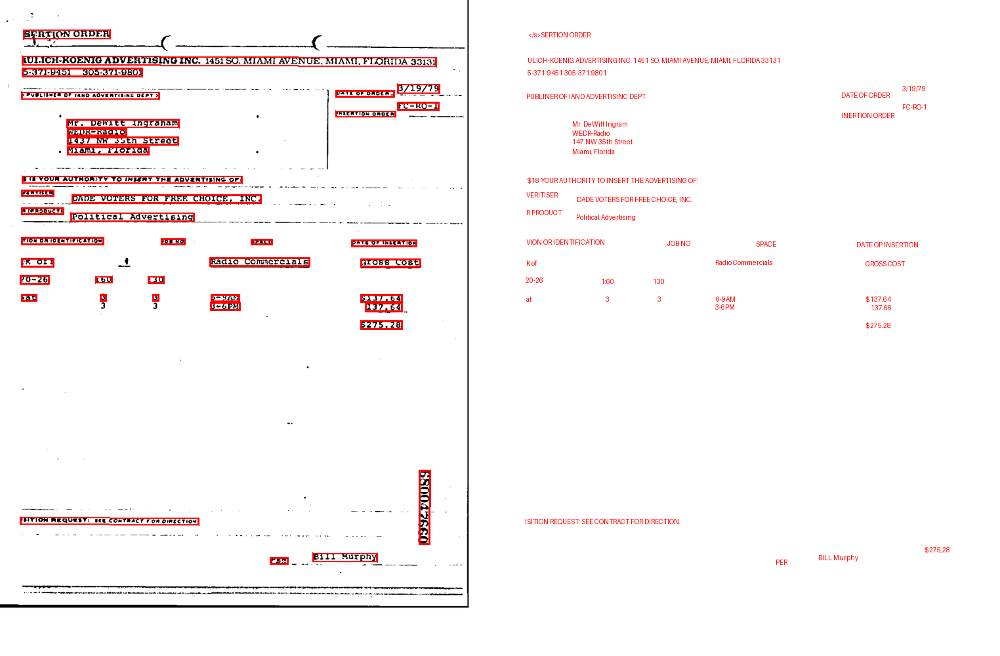

CPU times: user 8.42 s, sys: 2.27 ms, total: 8.42 s
Wall time: 8.42 s


In [71]:
%%time
path_image = "/kaggle/input/the-rvlcdip-dataset-test/test/invoice/0000037007.tif"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

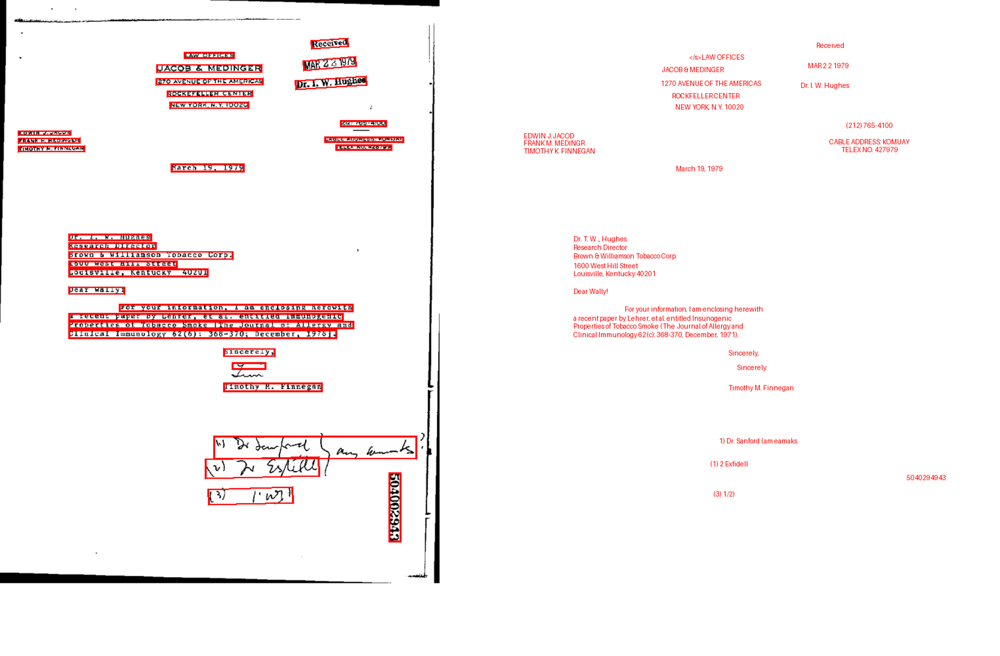

CPU times: user 7.89 s, sys: 1.53 ms, total: 7.9 s
Wall time: 7.89 s


In [77]:
%%time
path_image = "/kaggle/input/the-rvlcdip-dataset-test/test/letter/0000000700.tif"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

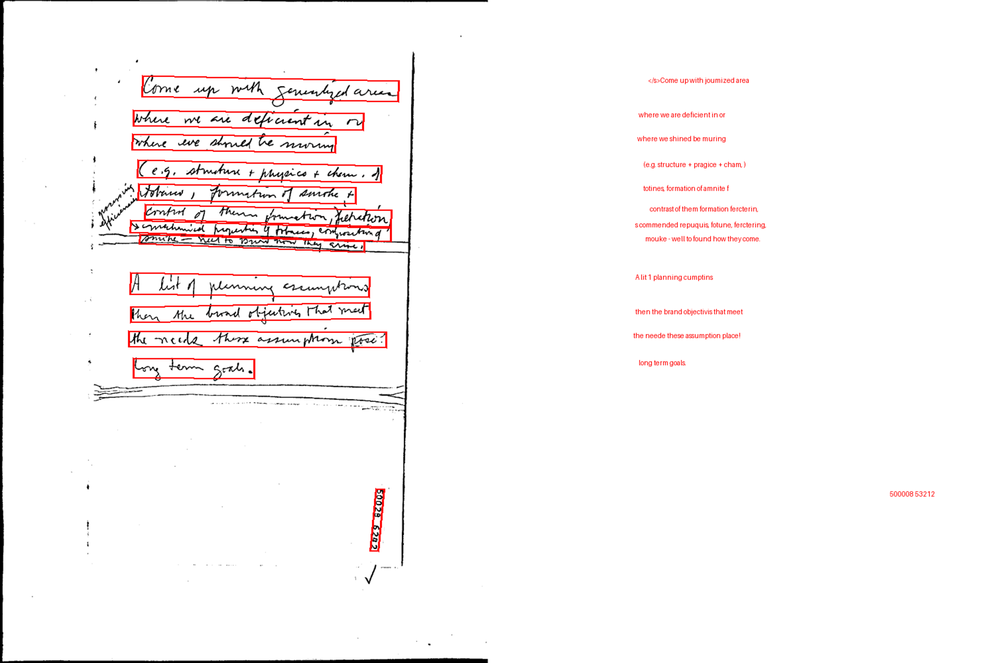

CPU times: user 3.94 s, sys: 4.23 ms, total: 3.95 s
Wall time: 3.95 s


In [73]:
%%time
path_image = "/kaggle/input/the-rvlcdip-dataset-test/test/handwritten/500286242+-6247.tif"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

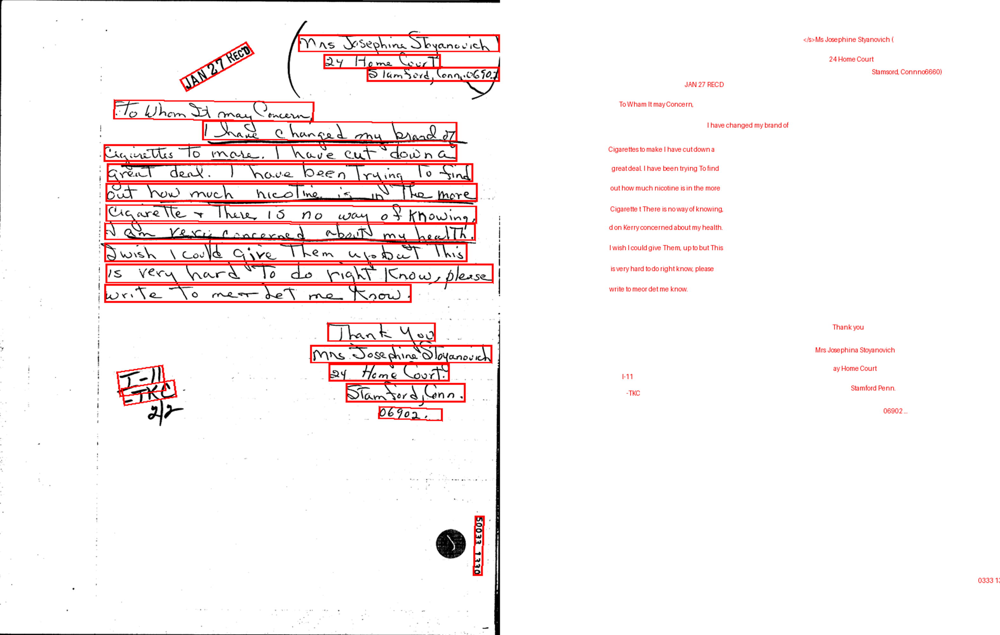

CPU times: user 5.4 s, sys: 3.69 ms, total: 5.4 s
Wall time: 5.41 s


In [74]:
%%time
path_image = "/kaggle/input/the-rvlcdip-dataset-test/test/handwritten/500331330.tif"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

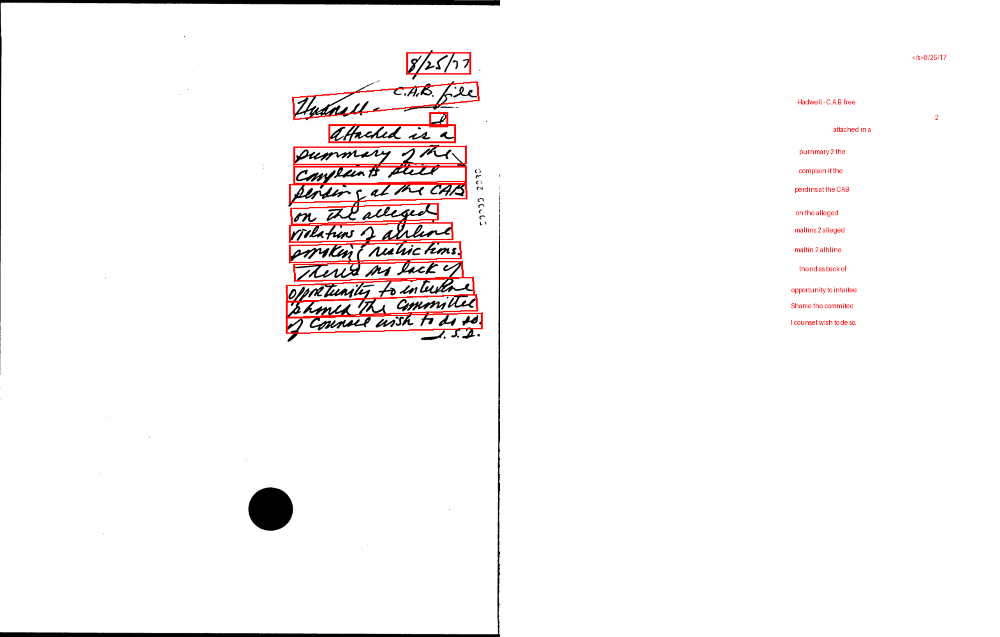

CPU times: user 3.58 s, sys: 3.16 ms, total: 3.58 s
Wall time: 3.59 s


In [72]:
%%time
path_image = "/kaggle/input/the-rvlcdip-dataset-test/test/handwritten/500002030.tif"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])